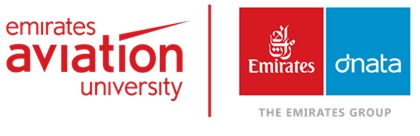  

# **X-Guard AI: Real-Time Edge Threat Detection in Security X-ray Images Using YOLOv11s**



**Submitted by:**  
Name: Magdy Keshta  
Student ID: 10382569  
Email: 10382569@eau.ac.ae  
<br><br>
**Introduction**  
  
  
 During this study, it was observed that most academic research in the field of X-ray threat detection focuses primarily on model development and performance evaluation, with relatively few studies addressing practical deployment aspects.  
   
To bridge this gap, a comparative analysis of leading object detection models was conducted to identify the most suitable solution for real-world implementation. The selected model was then integrated into a web application, enabling real-time threat detection and providing a practical framework for deployment in security screening environments..



# **🏨 1. Import Required Libraries and Datasets**

---



Dataset which used for training perpose is imported from Kaggle to be accessable for this project .

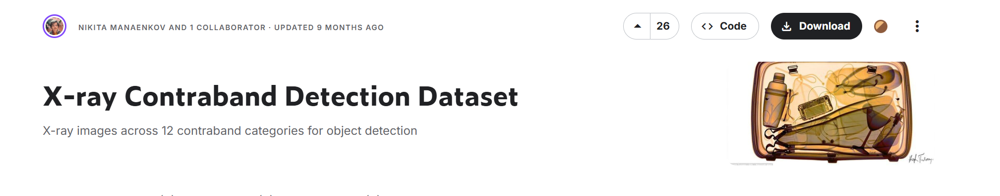

## **1.1 Install Requirements (Ultralytics)**

Next, we'll install the Ultralytics library in this Google Colab instance. This Python library will be used to train the YOLO model.

In [11]:
# Each time we started the colab the installation is required .
!pip install ultralytics

print("✅ Installation complete!")

✅ Installation complete!


In [12]:
#============== Import necessary libraries required for my project ============#
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix,roc_auc_score, roc_curve,log_loss
import statsmodels.api as sm
import glob
import json
import shutil
from PIL import Image
import yaml
import matplotlib.pyplot as plt
import random
import cv2
from ultralytics import YOLO
import os
from collections import Counter
import albumentations as A
from tqdm import tqdm
import random
from IPython.display import Image as IPyImage, display, HTML
import base64
import kagglehub
import torch
print(f"PyTorch version      : {torch.__version__}")

import transformers
print(f"Transformers version : {transformers.__version__}")
print("✅ Libraries imported successfully!")




PyTorch version      : 2.11.0+cpu
Transformers version : 5.16.1
✅ Libraries imported successfully!


---
## Check GPU Availability

transformers accepts `device=0` for GPU, `device=-1` for CPU.

In [14]:
device = 0 if torch.cuda.is_available() else -1

if device == 0:
    print("✅ GPU is enabled")
    print(f"   GPU name : {torch.cuda.get_device_name(0)}")
    print(f"   VRAM     : {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")
else:
    print("⚠️  Running on CPU — predictions will be slower.")
    print("   Tip: Enable GPU via Runtime → Change runtime type → T4 GPU")

⚠️  Running on CPU — predictions will be slower.
   Tip: Enable GPU via Runtime → Change runtime type → T4 GPU


In [15]:
import sys
import platform
print("Python Version:", sys.version)
print("Platform:", platform.platform())
print("Processor:", platform.processor())

Python Version: 3.13.15 (main, Aug  6 2026, 11:06:22) [GCC 13.3.0]
Platform: Linux-6.6.122+-x86_64-with-glibc2.39
Processor: x86_64


**Copy from Kaggle**

.
  
source : https://www.kaggle.com/datasets/nikitamanaenkov/x-ray-contraband-detection-dataset/data

In [4]:
#===================================== To Import the dateset from Kaggle to Local drive  =============================#


destination_path = '/content/Detection_Yolo/Dataset'

# Create the destination directory if it doesn't exist
os.makedirs(destination_path, exist_ok=True)

print(f"Downloading dataset from Kaggle Hub...")
# Download the dataset from Kaggle Hub
source_download_path = kagglehub.dataset_download("nikitamanaenkov/x-ray-contraband-detection-dataset")

print(f"Dataset downloaded to: {source_download_path}")

# Define the actual content folder inside the downloaded path

# List items in the downloaded directory to find the actual content
downloaded_items = os.listdir(source_download_path)

print(f"Moving downloaded content from {source_download_path} to {destination_path}")

for item_name in downloaded_items:
    source_item_path = os.path.join(source_download_path, item_name)
    destination_item_path = os.path.join(destination_path, item_name)
    try:
        shutil.move(source_item_path, destination_item_path)
        print(f"Moved: {source_item_path} to {destination_item_path}")
    except Exception as e:
        print(f"Error moving {source_item_path}: {e}")

print("Dataset transfer complete.")

100%|██████████| 1.12G/1.12G [00:16<00:00, 75.0MB/s]

Extracting files...


Dataset downloaded to: /root/.cache/kagglehub/datasets/nikitamanaenkov/x-ray-contraband-detection-dataset/versions/1
Moving downloaded content from /root/.cache/kagglehub/datasets/nikitamanaenkov/x-ray-contraband-detection-dataset/versions/1 to /content/Detection_Yolo/Dataset
Moved: /root/.cache/kagglehub/datasets/nikitamanaenkov/x-ray-contraband-detection-dataset/versions/1/data to /content/Detection_Yolo/Dataset/data
Dataset transfer complete.


### Contraband Categories in the Balanced X-ray Detection Dataset

| Class ID | Class Name |
|-----------|------------|
| 0 | Baton |
| 1 | Pliers |
| 2 | Hammer |
| 3 | Powerbank |
| 4 | Scissors |
| 5 | Wrench |
| 6 | Gun |
| 7 | Bullet |
| 8 | Sprayer |
| 9 | HandCuffs |
| 10 | Knife |
| 11 | Lighter |

*Table 1. Threat object categories included in the Balanced X-ray Contraband Detection Dataset.*


## Data Summary

The Balanced X-ray Contraband Detection Dataset includes:

- **13,728 X-ray security screening images**
- **13,728 annotation files (.txt) in YOLO format**
- **2 YAML configuration files**
- **12 contraband object categories**
- All images are provided in **JPG format**
- All annotations contain **bounding box labels compatible with YOLO-based models**

### Dataset Files

| File Type | Count |
|------------|---------:|
| .jpg Images | 13,728 |
| .txt Annotations | 13,728 |
| .yaml Configuration Files | 2 |

*Table 2. Summary of files included in the Balanced X-ray Contraband Detection Dataset.*



#**🧾2. Data scrubing**  

---


Ultralytics requires a particular folder structure to store training data for models done by the following .  

 **📁 Folder Structure**

```text
data/
│
├── images/
│   ├── train/
│   ├── val/
│   └── test/
│
├── labels/
│   ├── train/
│   ├── val/
│   └── test/
│
└── data.yaml
  
  images/: Contains X ray images.  
  labels/: Contains YOLO-format .txt annotation files



In [16]:
#++++++++++++++++++++++ Preparing the folders of the dataset ++++++++++++++++++++++#

base_input = "/content/Detection_Yolo/Dataset/data"
#base_output = "/content/Detection_Yolo/Dataset/split_data"

train_img_dir = os.path.join(base_input, "images/train")
print(train_img_dir)
train_lbl_dir = os.path.join(base_input, "labels/train")
print(train_lbl_dir)
val_img_dir = os.path.join(base_input, "images/val")
print(val_img_dir)
val_lbl_dir = os.path.join(base_input, "labels/val")
print(val_lbl_dir)
test_img_dir = os.path.join(base_input, "images/test")
print(test_img_dir)
test_lbl_dir = os.path.join(base_input, "labels/test")
print(test_lbl_dir)

/content/Detection_Yolo/Dataset/data/images/train
/content/Detection_Yolo/Dataset/data/labels/train
/content/Detection_Yolo/Dataset/data/images/val
/content/Detection_Yolo/Dataset/data/labels/val
/content/Detection_Yolo/Dataset/data/images/test
/content/Detection_Yolo/Dataset/data/labels/test


In [17]:
#+++++++++++++++++++ Get sum statistics about the Dataset +++++++++++++++++#


base_dir = "/content/Detection_Yolo/Dataset/data"

# TRAIN
train_images = glob.glob(os.path.join(base_dir, "images", "train", "*.jpg"))
train_labels = glob.glob(os.path.join(base_dir, "labels", "train", "*.txt"))

print("TRAIN DATA")
print(f"Total training images        : {len(train_images)}")
print(f"Total training YOLO labels   : {len(train_labels)}")

# VALIDATION
val_images = glob.glob(os.path.join(base_dir, "images", "val", "*.jpg"))
val_labels = glob.glob(os.path.join(base_dir, "labels", "val", "*.txt"))

print("\nVALIDATION DATA")
print(f"Total validation images      : {len(val_images)}")
print(f"Total validation YOLO labels : {len(val_labels)}")

# TEST
test_images = glob.glob(os.path.join(base_dir, "images", "test", "*.jpg"))
test_labels = glob.glob(os.path.join(base_dir, "labels", "test", "*.txt"))

print("\nTEST DATA")
print(f"Total test images            : {len(test_images)}")
print(f"Total test YOLO labels       : {len(test_labels)}")

# GRAND TOTAL SUMMARY
total_images = len(train_images) + len(val_images) + len(test_images)
total_labels = len(train_labels) + len(val_labels) + len(test_labels)

print("\nTOTAL DATASET")
print(f"Total images                 : {total_images}")
print(f"Total YOLO labels            : {total_labels}")

TRAIN DATA
Total training images        : 10982
Total training YOLO labels   : 10982

VALIDATION DATA
Total validation images      : 1373
Total validation YOLO labels : 1373

TEST DATA
Total test images            : 1373
Total test YOLO labels       : 1358

TOTAL DATASET
Total images                 : 13728
Total YOLO labels            : 13713


In [18]:
#+++++++++ Extracting the basic information ++++++++#

splits = ["train", "val", "test"]
base_dir = "/content/Detection_Yolo/Dataset/data"
names = [
    "Baton",       # 0
    "Pliers",      # 1
    "Hammer",      # 2
    "Powerbank",   # 3
    "Scissors",    # 4
    "Wrench",      # 5
    "Gun",         # 6
    "Bullet",      # 7
    "Sprayer",     # 8
    "HandCuffs",   # 9
    "Knife",       # 10
    "Lighter"      # 11
]

all_counts = Counter() # To accumulate counts across all splits

for split in splits:

    labels_path_for_split = os.path.join(base_dir, "labels", split)
    counts = Counter()
    print(f"Processing labels in: {labels_path_for_split}")

    # Check if the directory exists before attempting to list its contents
    if not os.path.isdir(labels_path_for_split):
        print(f"Warning: Directory not found for {labels_path_for_split}. Skipping this split.")
        continue

    for file_name in os.listdir(labels_path_for_split):
        # Ensure we only process text files (YOLO label files are .txt)
        if not file_name.endswith(".txt"):
            continue

        file_path = os.path.join(labels_path_for_split, file_name)
        # Skip empty files
        if os.path.getsize(file_path) == 0:
            continue

        try:
            with open(file_path, "r") as f:
                for line in f:
                    # Handle potential empty lines or malformed lines
                    if line.strip():
                        try:
                            cls_id = int(line.split()[0])
                            counts[cls_id] += 1
                            all_counts[cls_id] += 1 # Accumulate total counts
                        except (ValueError, IndexError):
                            print(f"Warning: Could not parse class ID in file {file_name}, line: '{line.strip()}'")
        except Exception as e:
            print(f"Error reading file {file_path}: {e}")

    print(f"\n=== {split.upper()} ===")
    if counts:
        for cls_id, count in sorted(counts.items(), key=lambda x: x[1], reverse=True):
            cls_name = names[cls_id] if 0 <= cls_id < len(names) else f"unknown_{cls_id}"
            print(f"{cls_name:<20} : {count}")
    else:
        print(f"No labels found for the {split.upper()} split or an error occurred.")

print(f"\n=== TOTAL COUNTS ACROSS ALL SPLITS ===")
if all_counts:
    for cls_id, count in sorted(all_counts.items(), key=lambda x: x[1], reverse=True):
        cls_name = names[cls_id] if 0 <= cls_id < len(names) else f"unknown_{cls_id}"
        print(f"{cls_name:<20} : {count}")
else:
    print("No total label counts found.")


Processing labels in: /content/Detection_Yolo/Dataset/data/labels/train

=== TRAIN ===
Knife                : 1224
Hammer               : 1222
Wrench               : 1215
HandCuffs            : 1209
Gun                  : 1201
Baton                : 1200
Powerbank            : 1200
Pliers               : 1198
Lighter              : 1192
Scissors             : 1191
Bullet               : 1182
Sprayer              : 1179
Processing labels in: /content/Detection_Yolo/Dataset/data/labels/val

=== VAL ===
Pliers               : 168
Scissors             : 166
Bullet               : 162
HandCuffs            : 156
Powerbank            : 154
Baton                : 148
Sprayer              : 146
Gun                  : 143
Lighter              : 142
Hammer               : 142
Wrench               : 135
Knife                : 132
Processing labels in: /content/Detection_Yolo/Dataset/data/labels/test

=== TEST ===
Gun                  : 175
Sprayer              : 170
Lighter              : 160
Powe

 # **🌍3. Exploratory data analysis (EDA)**

We will begin by examining the images that will be used for training, testing, and evaluation. This step ensures that the labels and bounding box annotations are accurate and properly aligned.


=== TRAIN ===


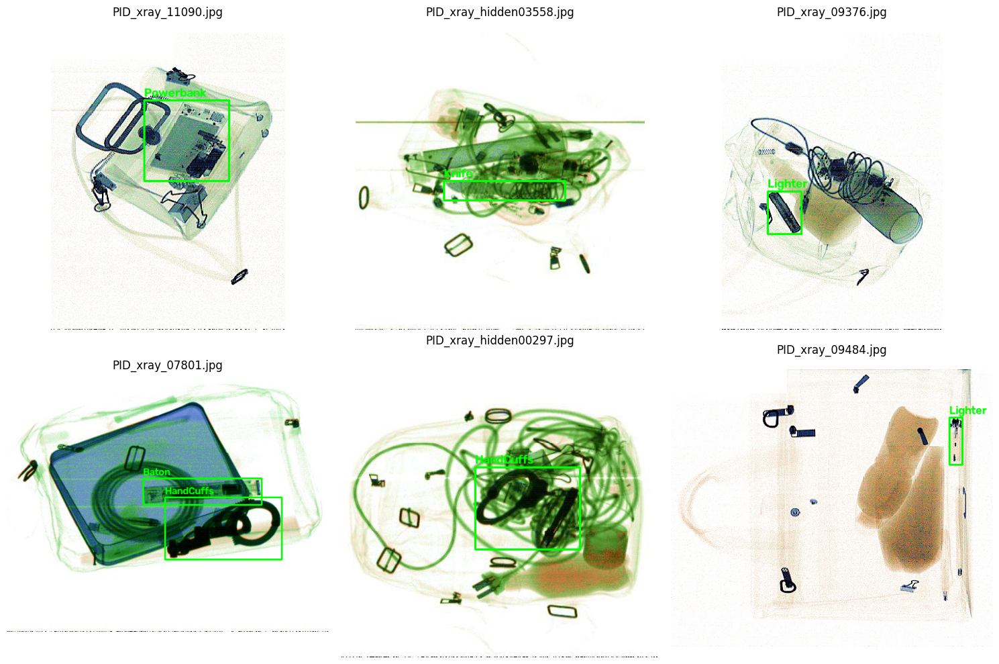


=== VAL ===


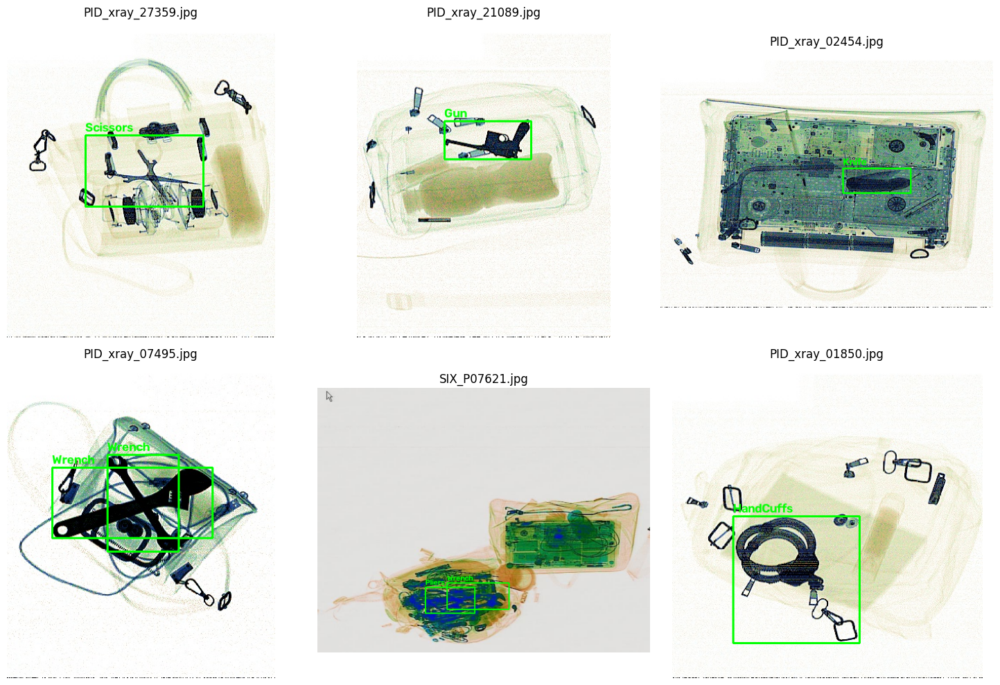


=== TEST ===


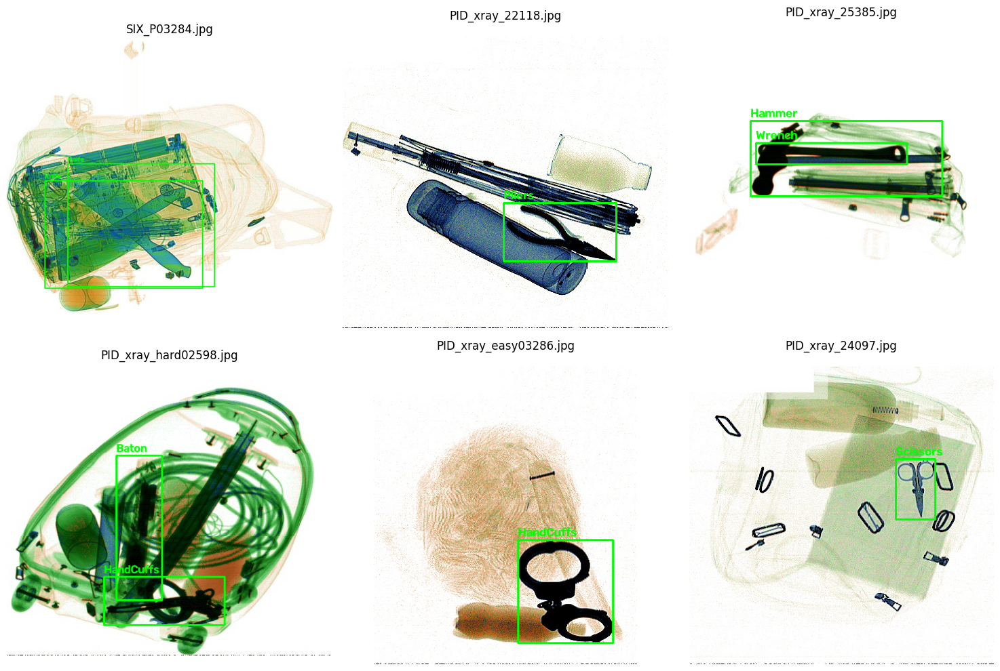

In [19]:
num_images_to_show = 6
images_per_row = 3

for split in splits:
    print(f"\n=== {split.upper()} ===")
    # Corrected path construction
    img_dir = os.path.join(base_input, "images", split)
    lbl_dir = os.path.join(base_input, "labels", split)

    # Check if the directories exist before listing to prevent FileNotFoundError on os.listdir
    if not os.path.isdir(img_dir):
        print(f"Warning: Image directory not found for {img_dir}. Skipping this split.")
        continue
    if not os.path.isdir(lbl_dir):
        print(f"Warning: Label directory not found for {lbl_dir}. Skipping this split.")
        continue

    images = os.listdir(img_dir)[:num_images_to_show]

    # Handle cases where there might be fewer images than num_images_to_show
    if not images:
        print(f"No images found in {img_dir}. Skipping display for this split.")
        continue

    n_rows = (len(images) + images_per_row - 1) // images_per_row
    plt.figure(figsize=(5 * images_per_row, 5 * n_rows))

    for idx, img_file in enumerate(images):
        img_path = os.path.join(img_dir, img_file)
        # Ensure we construct the label path correctly for the corresponding image
        label_file_name = os.path.splitext(img_file)[0] + ".txt"
        lbl_path = os.path.join(lbl_dir, label_file_name)

        img = cv2.imread(img_path)
        if img is None:
            print(f"Warning: Could not read image {img_path}. Skipping.")
            continue

        h_img, w_img = img.shape[:2]

        if os.path.exists(lbl_path) and os.path.getsize(lbl_path) > 0:
            try:
                with open(lbl_path, "r") as f:
                    for line in f:
                        # Handle potential errors in line parsing
                        parts = line.split()
                        if len(parts) == 5:
                            cls_id, x_center, y_center, w_box, h_box = map(float, parts)
                            x_center *= w_img
                            y_center *= h_img
                            w_box *= w_img
                            h_box *= h_img
                            x1 = int(x_center - w_box / 2)
                            y1 = int(y_center - h_box / 2)
                            x2 = int(x_center + w_box / 2)
                            y2 = int(y_center + h_box / 2)
                            color = (0, 255, 0) # Green color for bounding box

                            # Ensure cls_id is within valid range for 'names'
                            class_index = int(cls_id)
                            if 0 <= class_index < len(names):
                                cls_name = names[class_index]
                            else:
                                cls_name = f"unknown_{class_index}"

                            cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
                            cv2.putText(img, cls_name, (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
                        else:
                            print(f"Warning: Malformed line in {lbl_path}: {line.strip()}")
            except Exception as e:
                print(f"Error processing label file {lbl_path}: {e}")

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(n_rows, images_per_row, idx + 1)
        plt.imshow(img_rgb)
        plt.axis("off")
        plt.title(img_file)

    plt.tight_layout()
    plt.show()

# 🛠️**4. Model stage**  
YOLOv11s was chosen for this study because it provides an effective trade-off between accuracy and computational cost, making it well-suited for real-time security screening applications.  
  
Compared to larger detection models, it delivers fast inference, reduced resource requirements, and reliable threat detection performance, supporting efficient deployment in web-based and edge AI security systems.

##**4.1 Configure Training**

There's one last step before we can run training: we need to create the Ultralytics training configuration YAML file. This file specifies the location of your train and validation data, and it also defines the model's classes.

In [20]:
#======== creating the Yaml file required for the model training , We call it the modeling config file===========#

data_yaml = {
    "train": train_img_dir,
    "val": val_img_dir,
    "test": test_img_dir,
    "nc": 12,
    "names": ['Baton', 'Pliers', 'Hammer', 'Powerbank', 'Scissors', 'Wrench', 'Gun', 'Bullet', 'Sprayer', 'HandCuffs', 'Knife', 'Lighter']
}


yaml_path = "/content/Detection_Yolo/Dataset/data/data.yaml" ##>>> ymal_path
os.makedirs(os.path.dirname(yaml_path), exist_ok=True)
with open(yaml_path, "w") as f:
    yaml.dump(data_yaml, f, sort_keys=False)

print(f"data.yaml created at {yaml_path}")

data.yaml created at /content/Detection_Yolo/Dataset/data/data.yaml


## 4.2 Training Parameters
Now that the data is organized and the config file is created, we're ready to start training! First, there are a few important parameters to decide on.


### ✅ YOLOv11 Training Parameters Overview

---

#### **📌 Model Architecture & Size (`model`):**
YOLOv11 offers multiple model sizes for training:
- `yolov11n.pt` (nano)
- `yolov11s.pt` (small)
- `yolov11m.pt` (medium)
- `yolov11l.pt` (large)
- `yolov11x.pt` (extra-large)

**Key trade-off:**
- Larger models → Higher accuracy, slower speed, more resources.
- Smaller models → Faster, lightweight, slightly lower accuracy.

YOLOv11s was chosen for its modern architecture, efficiency, and strong real-time detection performance.

---

#### **📌 Number of Epochs (`epochs`):**
- An **epoch** = one complete pass through the training dataset.
- The number of epochs determines how long the model trains.
- Common range: **50–100 epochs**, depending on dataset size and complexity.

---

#### **📌 Resolution (`imgsz`):**
- Image resolution impacts **speed** and **accuracy**:
  - Lower resolution → Faster training/inference, less accuracy.
  - Higher resolution → Better detection, slower processing.
- YOLO models typically use **640×640** resolution for a balance of speed and accuracy.





In [21]:
# Configuration DATASET
data_yaml="/content/Detection_Yolo/Dataset/data/data.yaml"

# Configuration  PROJECT
train_folder_name = "xod"
resume_mode = True


In [33]:
##################################################################################################
# Before Proceed with the traing , I have made the files which will be the output of the taining #
# Ready at the GitHUB just to clone the files and skp the next cell                              #
##################################################################################################

# 1) Clone the repository
!git clone --progress https://github.com/Magdy-Keshta/em08ds_xod_project.git

for item in os.listdir("em08ds_xod_project"):
    shutil.move(os.path.join("em08ds_xod_project", item), ".")

os.rmdir("em08ds_xod_project")

print(os.listdir("."))

Cloning into 'em08ds_xod_project'...
remote: Enumerating objects: 1461, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 1461 (delta 4), reused 3 (delta 3), pack-reused 1454 (from 1)
Receiving objects: 100% (1461/1461), 140.23 MiB | 33.49 MiB/s, done.
Resolving deltas: 100% (9/9), done.
['.config', 'Detection_Yolo', 'LICENSE', 'XOD_WebApp', '.ipynb_checkpoints', 'requirements.txt', '.git', 'README.md', 'docs', 'xod', 'sample_data']


In [32]:


# folder_to_delete = '/content/.git'

# if os.path.exists(folder_to_delete) and os.path.isdir(folder_to_delete):
#     try:
#         shutil.rmtree(folder_to_delete)
#         print(f"Successfully deleted the folder: {folder_to_delete}")
#     except OSError as e:
#         print(f"Error: {folder_to_delete} : {e.strerror}")
# else:
#     print(f"The folder {folder_to_delete} does not exist or is not a directory.")


Successfully deleted the folder: /content/.git


##**4.3 Run the training!**  

We will refrain from executing the training code, as the training results have already been documented in a previous session.

The training conducted through Google GPU T4 and took approx 4 hours of tarinaing

In [13]:
print(os.getcwd())
model = YOLO("yolo11s.pt") # Load a pretrained YOLO  model



project = "/content/xod"  # Define the project directory

results = model.train(
    data=data_yaml,
    epochs=50, # Set the number of training epochs
    patience=12, # Set the patience for early stopping
    imgsz=640, # Set the image size for training
    batch=16, # Set the batch size
    device='0', # Specify the device to use (0 for GPU)
    optimizer="AdamW",
    lr0=0.001,
    lrf=0.0001,
    cos_lr=True,
    pretrained=True,
    augment=True,
    fliplr=0.5,
    degrees=10,
    mosaic=1.0,
    mixup=0.1,
    hsv_v=0.2,
    hsv_s=0.2,
    cache=True,
    workers=2,
    amp=True,
    verbose=True,  # Enable verbose output
    resume=resume_mode,
    project= project, # Specify the project directory
    name=train_folder_name,# Name of the experiment
)

print("Training finished.")

/content
WARNING ⚠️ model 'yolo11s.pt' is not a resumable training checkpoint (missing epoch/optimizer state). Use 'resume' only to continue incomplete training. Starting new training instead.
Ultralytics 8.4.146 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/Detection_Yolo/Dataset/data/data.yaml, degrees=10, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.2, hsv_v=0.2, imgsz=640, iou=0.7, keras=False, kobj=

**Extracting the information about the trained Model to give better understanding**

In [34]:
# Load a pretrained YOLO model (e.g., yolov8n.pt or a custom best.pt file)
model = YOLO('/content/xod/xod/weights/best.pt')

# Get the class names (a dictionary mapping class IDs to names)
print(f"Class names: {model.names}")

# Get the model task (e.g., 'detect', 'segment', 'classify')
print(f"Model task: {model.task}")

# Get the checkpoint data (contains training arguments, metadata, etc.)
print(f"Checkpoint data: {model.ckpt.keys()}")

print("\n\n\n================================= Model Info ==============================\n ")
model.model


Class names: {0: 'Baton', 1: 'Pliers', 2: 'Hammer', 3: 'Powerbank', 4: 'Scissors', 5: 'Wrench', 6: 'Gun', 7: 'Bullet', 8: 'Sprayer', 9: 'HandCuffs', 10: 'Knife', 11: 'Lighter'}
Model task: detect
Checkpoint data: dict_keys(['date', 'version', 'license', 'docs', 'epoch', 'best_fitness', 'model', 'ema', 'updates', 'modelopt', 'optimizer', 'scaler', 'train_args', 'train_metrics', 'train_results', 'git'])



================================= Model Info ==============================
 


DetectionModel(
  (model): Sequential(
    (0): Conv(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (1): Conv(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (2): C3k2(
      (cv1): Conv(
        (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (cv2): Conv(
        (conv): Conv2d(96, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
 

##**4.4 Model Evaluating**

The model has been trained; now it's time to evalute it! The commands below run the model on the images in the validation folder and then display the results for the first 10 images. This is a good way to confirm our model is working as expected.

In [15]:
results_dir = '/content/xod/xod'
best_model_path = os.path.join(results_dir, "weights", "best.pt")

trained_model = YOLO(best_model_path)
trained_model.info()

print("Validation on the test dataset......")
metrics = trained_model.val(split="test", project='/content/xod', name='xod') # Save results directly to xod folder
print(metrics)


YOLO11s summary: 181 layers, 9,432,436 parameters, 0 gradients, 21.7 GFLOPs
Validation on the test dataset......
Ultralytics 8.4.146 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11s summary (fused): 100 layers, 9,417,444 parameters, 0 gradients, 21.4 GFLOPs
WARNING ⚠️ val: Slow image access detected (ping: 0.0±0.0 ms, read: 19.2±8.6 MB/s, size: 60.8 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips
val: Scanning /content/Detection_Yolo/Dataset/data/labels/test... 1358 images, 15 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1373/1373 561.1it/s 2.4s
val: New cache created: /content/Detection_Yolo/Dataset/data/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 86/86 4.4it/s 19.5s
                   all       1373       1807      0.928      0.864       0.92      0.748
                 Baton        130      

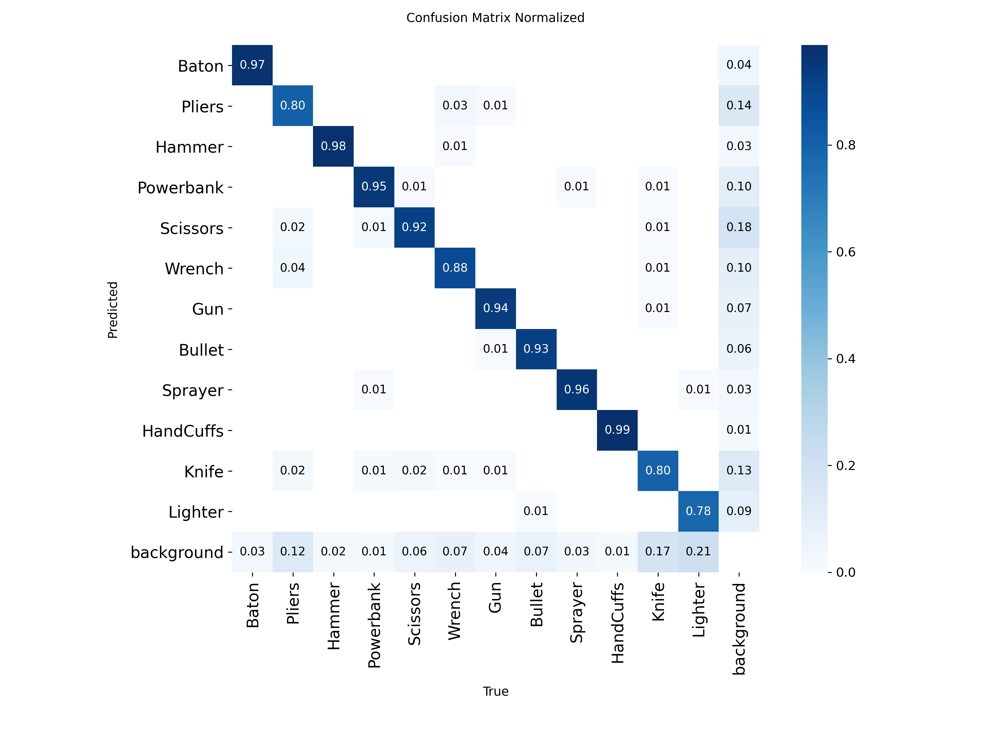

In [35]:
IPyImage(filename=f'/content/xod/xod/confusion_matrix_normalized.png', width=900)

**Manual calculation to get the Global Evaluation for our Model**

In [17]:
# Global Evaluation
mp = metrics.box.mp     # mean precision
mr = metrics.box.mr     # mean recall
map50 = metrics.box.map50
map5095 = metrics.box.map

# Calc F1-score
f1 = 2 * (mp * mr) / (mp + mr + 1e-6)

print(f"Precision  : {mp:.4f}")
print(f"Recall     : {mr:.4f}")
print(f"F1-score   : {f1:.4f}")
print(f"mAP@50     : {map50:.4f}")
print(f"mAP@50-95  : {map5095:.4f}")

Precision  : 0.9276
Recall     : 0.8645
F1-score   : 0.8949
mAP@50     : 0.9204
mAP@50-95  : 0.7479


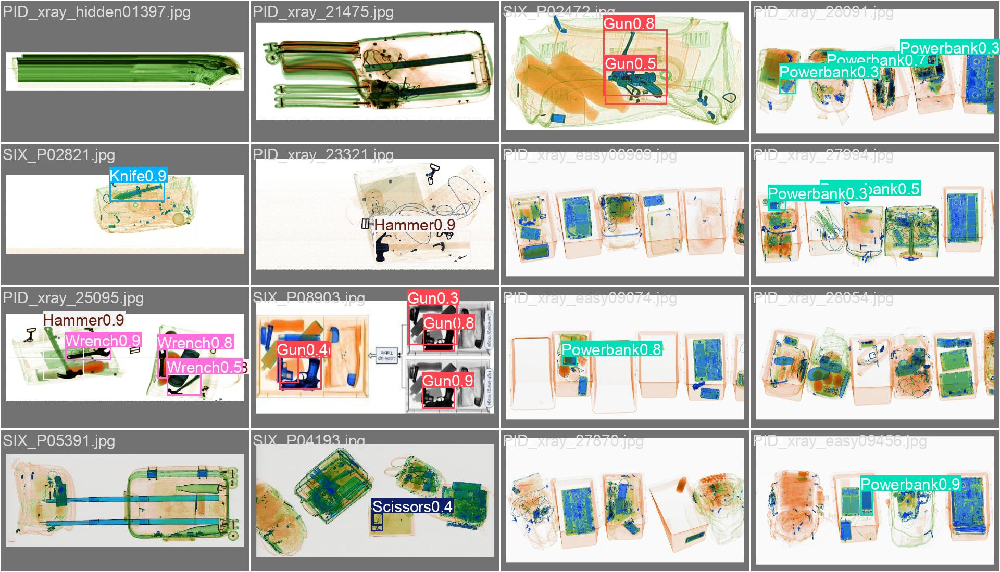

In [37]:
IPyImage(filename=f'/content/xod/xod-2/val_batch0_pred.jpg', width=1200)

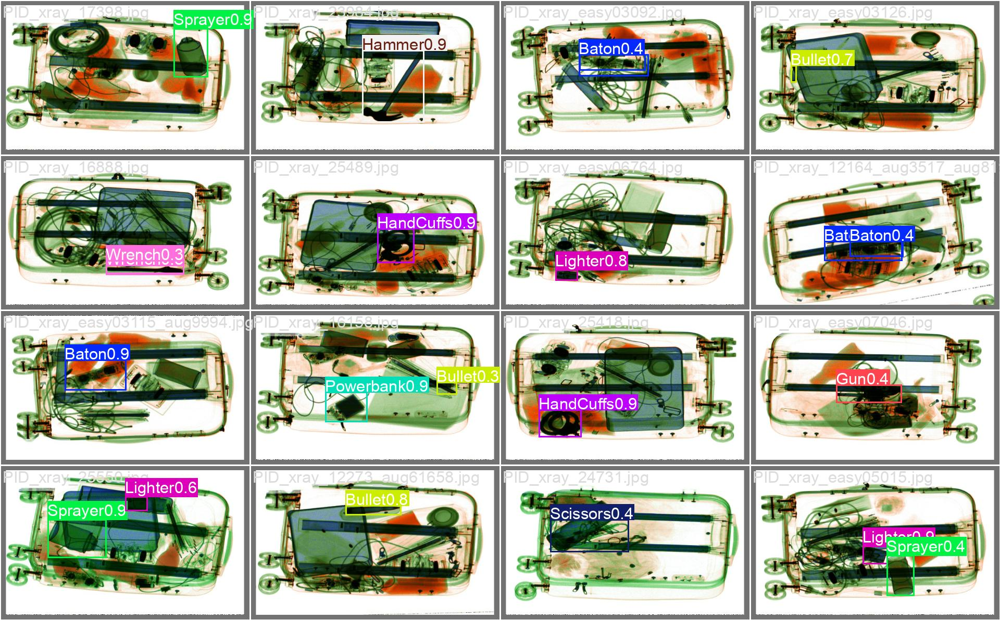

In [38]:
IPyImage(filename=f'/content/xod/xod-2/val_batch2_pred.jpg', width=1200)

**4.5 Model testing**



The model has been trained; now it's time to test it! The commands below run the model on the images in the validation folder and then display the results for the first 10 images. This is a good way to confirm your model is working as expected. Click Play on the blocks below to see how your model performs.

In [44]:
results_dir = '/content/xod/xod'
best_model_path = os.path.join(results_dir, "weights", "best.pt")

trained_model = YOLO(best_model_path)
results = trained_model.predict(
    source=f"/content/Detection_Yolo/Dataset/data/images/test",
    conf=0.5,
    save=True,
    project="/content/xod/xod-1",
    name="test"
)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1373 /content/Detection_Yolo/Dataset/data/images/test/PID_xray_00024.jpg: 512x640 1 Baton, 664.3ms
image 2/1373 /content/Detection_Yolo/Dataset/data/images/test/PID_xray_00035.jpg: 512x640 1 Baton, 419.9ms
image 3/1373 /content/Detection_Yolo/Dataset/data/images/test/PID_xray_00039.jpg: 640x640 1 Baton, 485.8ms
image 4/1373 /content/Detection_Yolo/Dataset/data/images/test/PID_xray_00047.jpg: 608x640 1 Baton, 467.2ms
image 5/1373 /content/Detection

KeyboardInterrupt: 

,,,,
,,,,
,,,,
,,,,

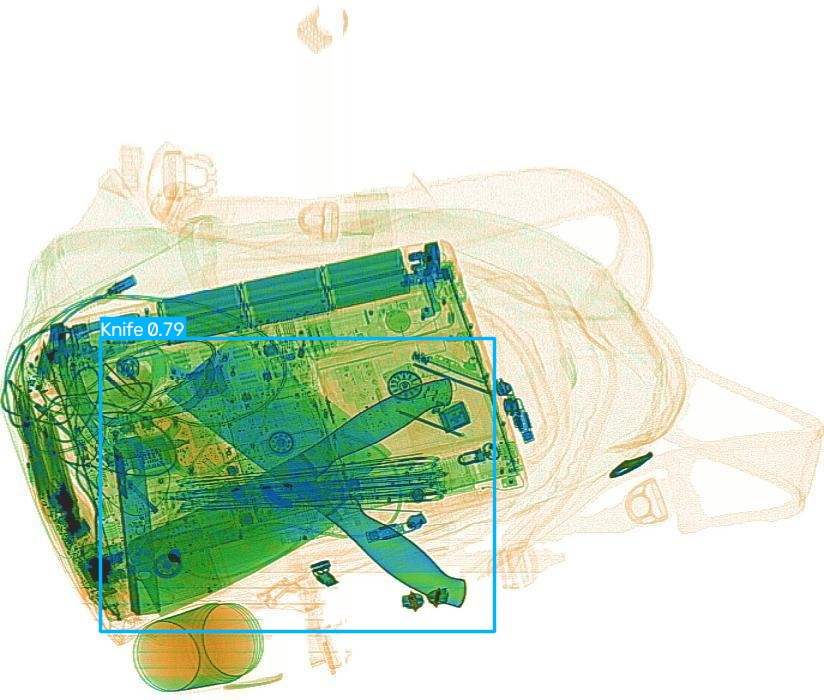
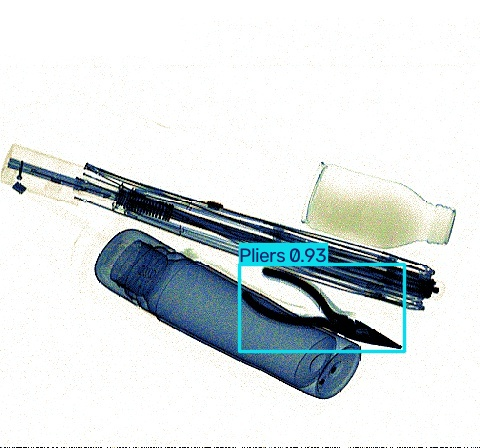
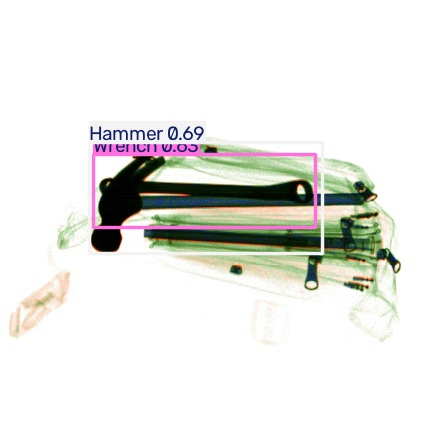
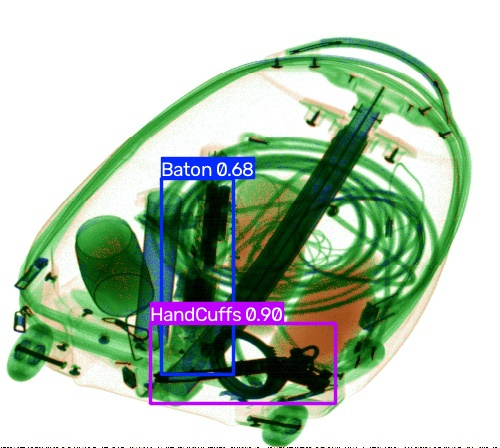
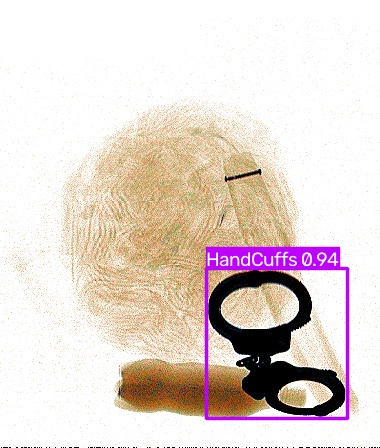
...
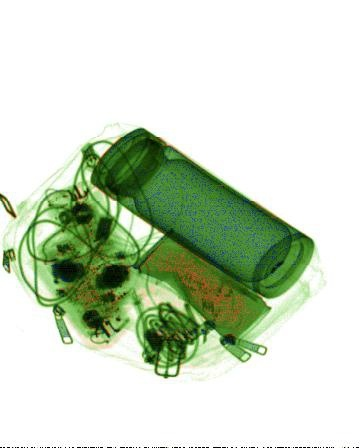
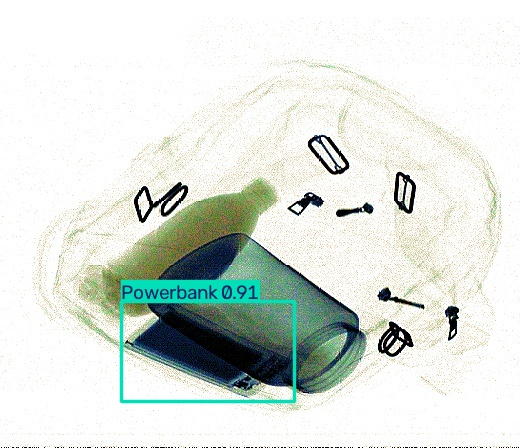
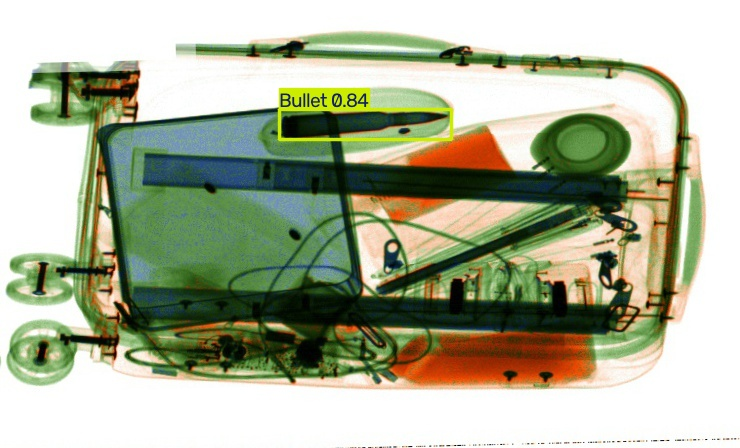
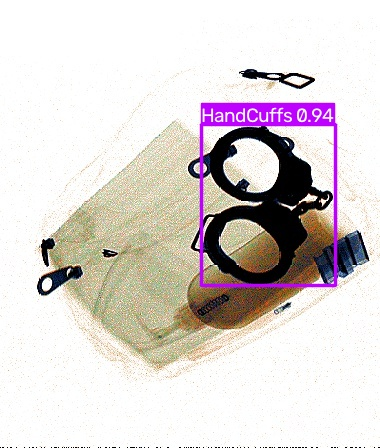
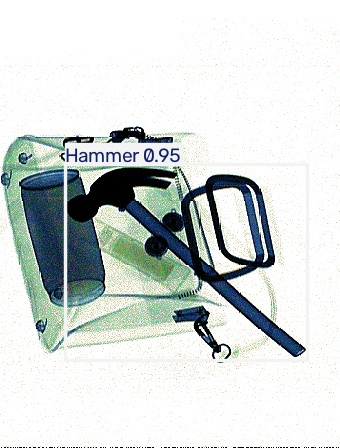

In [45]:
def img_to_base64(img_path):
    with open(img_path, "rb") as f:
        b64 = base64.b64encode(f.read()).decode()
        return f'<img src="data:image/jpg;base64,{b64}" width="200"/>'

latest_folder = max(glob.glob('/content/xod/test/'), key=os.path.getmtime)
images = glob.glob(f'{latest_folder}/*.jpg')[:20]

imgs_per_row = 5
html = "<table>"
for i in range(0, len(images), imgs_per_row):
    html += "<tr>"
    for img_path in images[i:i+imgs_per_row]:
        html += f"<td>{img_to_base64(img_path)}</td>"
    html += "</tr>"
html += "</table>"

display(HTML(html))

# **✅ 5. Interpretation and Evaluation**


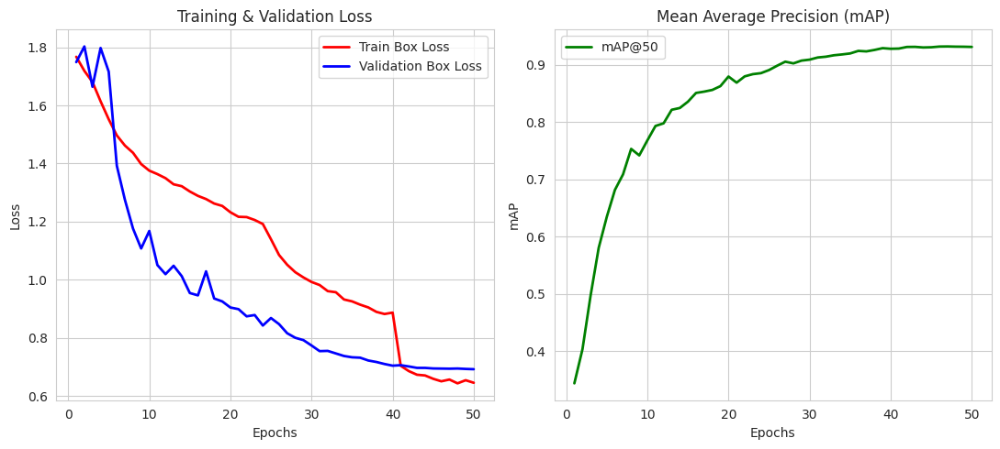

In [46]:
df = pd.read_csv('/content/xod/xod/results.csv')

map_column = "metrics/mAP50(B)"
loss_column_train = "train/box_loss"
loss_column_val = "val/box_loss"

plt.figure(figsize=(11,5))

sns.set_style("whitegrid")

plt.subplot(1, 2, 1)
plt.plot(df["epoch"], df[loss_column_train], label="Train Box Loss", color="red", linewidth=2)
plt.plot(df["epoch"], df[loss_column_val], label="Validation Box Loss", color="blue", linewidth=2)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training & Validation Loss")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(df["epoch"], df[map_column], label="mAP@50", color="green", linewidth=2)
plt.xlabel("Epochs")
plt.ylabel("mAP")
plt.title("Mean Average Precision (mAP)")
plt.legend()

plt.tight_layout()

plt.show()



## **📊5.1 Training and Validation Performance Analysis**

The training and validation loss curves demonstrate a clear and stable learning behavior. During the initial epochs, both training and validation box losses decrease sharply, indicating effective feature learning and rapid model convergence. The training loss continues to decline steadily throughout the training process, confirming consistent optimization on the training dataset.

The validation loss follows a similar trend in the early stages but begins to plateau after approximately 50–60 epochs, with a slight upward drift observed in later epochs. This divergence between training and validation loss suggests the presence of mild overfitting. However, the gap between the two curves remains relatively small, indicating that the model maintains acceptable generalization capability.

## Mean Average Precision (mAP) Evaluation

The mAP@50 curve shows a rapid increase during the early training phase, reaching approximately 0.50 within the first 20 epochs. This behavior indicates that the model quickly learns meaningful object representations. Following this initial growth, performance improvements become more gradual, and the mAP stabilizes around 0.61–0.62.

The stabilization of the mAP curve corresponds closely with the plateau observed in the validation loss, confirming that the model has reached convergence. Importantly, no significant degradation in mAP is observed at later epochs, suggesting stable detection performance without severe overfitting.



---



## ✅Summary of Observations

- The model exhibits stable convergence and effective learning behavior.
- Early epochs contribute the majority of performance gains.
- Later epochs yield diminishing returns, indicating that early stopping could improve training efficiency.
- The achieved mAP@50 reflects moderate detection accuracy, providing a solid baseline for further model refinement and enhancement.




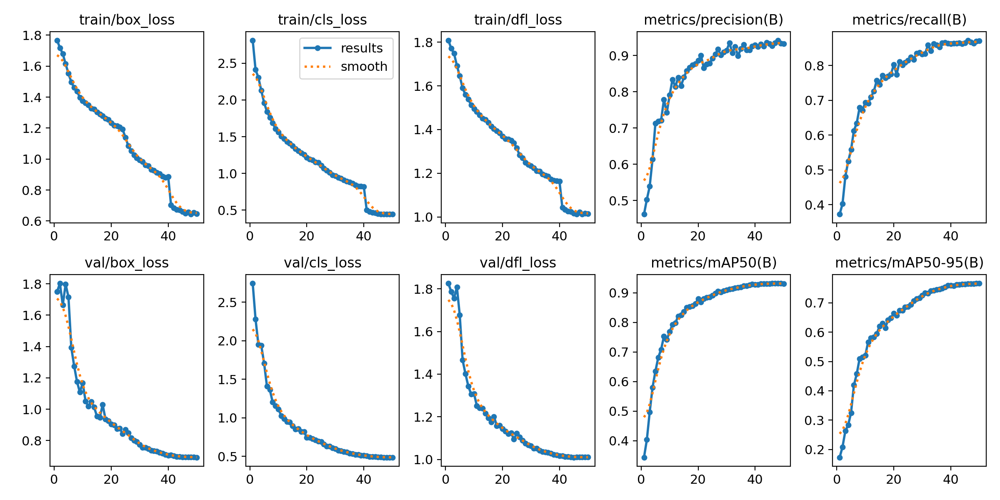

In [47]:
IPyImage(filename=f'/content/xod/xod/results.png', width=900)


##**5.2 Model Training & Validation Interpretation**

This section summarizes and interprets the learning curves for the YOLO model across ~120 epochs, based on the provided results figure (train/val losses, Precision, Recall, mAP50, and mAP50–95).

---

## 1) Loss Curves (Convergence Behavior)

**Train vs. Val Losses**
- **Box loss (train & val)**: Monotonic decline from ≈2.2–2.3 down to ≈1.4–1.7, indicating improving localization.
- **Cls loss (train & val)**: Drops from ≈3.0 (train) / ≈2.75 (val) to ≈1.5–1.75, reflecting better class discrimination.
- **DFL loss (train & val)**: Decreases from ≈2.0 to ≈1.4–1.6, suggesting improved distribution-aware box regression.

**Interpretation**
- The **parallel downward trends** of training and validation losses imply **stable learning** without obvious overfitting.
- The **gap** between train and val losses remains **modest and consistent**, which is a healthy sign of generalization.

---



## 2) Overall Assessment

- The model **converges steadily** with **no severe overfitting** trends visible.
- Performance gains are **consistent** across epochs for both classification and localization.
- Final metrics are **reasonable** for a first pass and provide a solid baseline.

---
